# Práctica 3 PVC
### Natalia Martínez García y Lucía Vega Navarrete - Grupo 1.1

In [1]:
import numpy as np
from pathlib import Path
import pandas as pd
from skimage import io
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, jaccard_score
import matplotlib.pyplot as plt
from skimage.color import rgb2hsv
from skimage.morphology import binary_opening, binary_closing, disk, remove_small_objects, remove_small_holes
from scipy.ndimage import maximum_filter, minimum_filter, uniform_filter
from skimage.filters import frangi, sobel, gaussian, laplace 
from skimage.feature import canny                             
from skimage.transform import resize


In [2]:
# Fijamos la semilla para poder reproducir los resultados
import random
seed = 123
np.random.seed(seed)
random.seed(seed)

## Ejercicio 1 -  Segmentación de carreteras en imagen aérea de alta resolución

### Carga del dataset

Primero cargamos todas las imágenes de satélite y sus máscaras correspondientes desde las carpetas del dataset. Para garantizar que cada imagen está emparejada con su máscara correcta, primero se listan y ordenan los archivos. Después, las imágenes se leen tal cual y las máscaras se binarizan para obtener valores 0/1. Luego, todo se convierte en arrays NumPy para poder procesarlo de forma eficiente en los siguientes pasos de la práctica. Por último, imprimimos las dimensiones de las imágenes para comprobar que todo se ha cargado correctamente. 

In [3]:
# Ruta al dataset
# Lo tenemos en la misma carpeta que el notebook
dataset_path = Path("DataSet_1/roads")
sat_path = dataset_path / "sat" # Carpeta con las imagenes por satelite (inputs del modelo)
gt_path = dataset_path / "gt" # Carpeta con las carreteras marcadas (salidas esperadas)

# Cargar las imágenes
# Las ordenamos para que cada imagen de la carpeta sat este en la misma posicion que en la carpeta gt (tienen el mismo nombre)
sat_files = sorted(sat_path.glob("*.tif*")) # Leer todas las de la carpeta a la vez
gt_files = sorted(gt_path.glob("*.tif*"))

# Listas donde almacenamos las imágenes y sus máscaras ya cargadas
images = []
masks = []

# Recorremos ambas listas en parallelo
for sat_file, gt_file in zip(sat_files, gt_files):
    # Cargar imagen RGB del satelite
    img = io.imread(sat_file)
    images.append(img)
    
    # Cargar y preparar la máscara
    mask = io.imread(gt_file) # La máscara suele venir en escala de grises con valores 0 (fondo) y 255 (carretera)
    mask = (mask > 128).astype(np.uint8) # Lo tenemos que poner convertir a binario (0 y 1) porque ahora tiene como valores 0 y 255
    masks.append(mask)
    
# Convertimos las listas a arrays numpy para poder indexarlas 
images = np.array(images)
masks = np.array(masks)

# Comprobamos las dimensiones
print(f"Shape imágenes: {images.shape}")
print(f"Shape máscaras: {masks.shape}")

Shape imágenes: (20, 1500, 1500, 3)
Shape máscaras: (20, 1500, 1500)


La salida confirma que el dataset se ha cargado correctamente: tenemos 20 imágenes y 20 máscaras, todas con un tamaño uniforme de 1500×1500 píxeles. Las imágenes son RGB (por eso tienen 3 canales) y las máscaras están en formato binario de una sola capa. Esto indica que el procesamiento previo funcionó como se esperaba y que los datos están listos para continuar con el preprocesado y el diseño del método de segmentación.

### División de los datos

Aquí hacemos una división aleatoria del dataset en entrenamiento, validación y test. Para ello, primero generamos una permutación aleatoria de los índices de todas las imágenes, asegurando que la selección no siga ningún patrón del orden original. A partir de esa lista mezclada, se toman 2 imágenes para test, 2 para validación y el resto para entrenamiento. Después, se usan esos índices para extraer las imágenes y máscaras correspondientes, obteniendo así tres subconjuntos diferenciados que se utilizarán para entrenar, ajustar y evaluar el método de segmentación.

In [4]:
# Dividimos aleatoriamente
n_total = len(images) 
indices = np.random.permutation(n_total) # Devuelve una secuencia desordenada de numeros del 0 a n_total - 1

# Dividimos el dataset por indices
test_indices = indices[:2] # 2 primeras para test
val_indices = indices[2:4] # 2 siguientes para val
train_indices = indices[4:] # resto para train

# Construimos cada subconjunto 
X_test = images[test_indices]
y_test = masks[test_indices]

X_val = images[val_indices]
y_val = masks[val_indices]

X_train = images[train_indices]
y_train = masks[train_indices]

# Comprobamos cuántas imágenes contiene cada partición
print(f"Total: {n_total} imágenes")
print(f"Train: {len(X_train)} imágenes")
print(f"Validación: {len(X_val)} imágenes")
print(f"Test: {len(X_test)} imágenes")

Total: 20 imágenes
Train: 16 imágenes
Validación: 2 imágenes
Test: 2 imágenes


La salida muestra que la división se realizó correctamente: 16 imágenes para entrenar, 2 para validar y 2 para test. Esta distribución es coherente con el tamaño del dataset y permite disponer de suficientes ejemplos para entrenar un modelo básico, reservando al mismo tiempo datos independientes para comprobar el rendimiento y evitar sobreajuste. Esto confirma que la partición aleatoria ha funcionado como se esperaba y los conjuntos están listos para los siguientes pasos.

### Preprocesado + Extracción de características 

#### Preprocesado

Una vez dividido el conjunto de datos, tenemos que aplicar un preprocesado que deje las imágenes listas para trabajar a nivel de píxel. En nuestro caso, utilizamos la función `normalize_images`, que convierte las intensidades originales de 0–255 al rango [0, 1] para poder usar las imágenes como entrada de los modelos de clasificación. Luego, usamos la función `flatten_data` para aplanar las imágenes y sus máscaras, pasando de una representación por imagen a una representación por píxel. 

Debido a que en la mayoría de píxeles pertenecen a fondo y solo una parte pequeña corresponde a carreteras, el conjunto de datos está muy desbalanceado. Para evitar que los modelos se inclinen hacia   la clase mayoritaria, aplicamos un undersampling balanceado mediante la función `undersample`. Esta función selecciona el mismo número de píxeles de carretera y de fondo, ya sea utilizando todos los disponibles de la clase minoritaria o fijando explícitamente un número máximo de píxeles por clase (`n_per_class`). Además, la selección se realiza de forma aleatoria pero controlada mediante una semilla (`random_state`), lo que permite repetir los experimentos con las mismas muestras. 

In [5]:
def normalize_images(images):
    """Normaliza imágenes al rango [0, 1]"""
    return images.astype(np.float32) / 255.0

def flatten_data(X, y):
    """Aplana los datos"""
    X_flat = X.reshape(-1, X.shape[-1])
    y_flat = y.reshape(-1)
    return X_flat, y_flat

def undersample(image, mask, n_per_class=None, random_state=None):
    """
    Realiza undersampling balanceado entre clases y permite fijar cuántos píxeles por clase se quieren usar.
    """

    # Índices de cada clase
    road_idx = np.where(mask == 1)[0]
    bg_idx   = np.where(mask == 0)[0]

    # Generador de aleatoriedad (por si queremos repetir experimentos)
    rng = np.random.default_rng(random_state)

    if n_per_class is None: # Si no se especifica el nº de píxeles por clase 
        # Igualamos los datos de la clase mayoritaria al nº de la minoritaria
        n_road = len(road_idx) # num de datos de la minoritaria 
        bg_sampled = rng.choice(bg_idx, n_road, replace=False) # cogemos tantos péxeles de fondo como píxeles de carretera sin reemplazo (no seleccionar el mismo pixel dos veces)
    else: 
        # Fijamos el nº de píxeles por clase
        n_road = len(road_idx)
        n_bg = len(bg_idx)

        # No podemos muestrear más de los que hay
        n_pix = min(n_per_class, n_road, n_bg)

        road_sampled = rng.choice(road_idx, n_pix, replace=False)
        bg_sampled = rng.choice(bg_idx, n_pix, replace=False)

    # Mezclamos
    selected = np.concatenate([road_sampled, bg_sampled])
    rng.shuffle(selected)

    return image[selected], mask[selected]

#### Extracción de características 

Para mejorar la representación de cada píxel antes de entrenar los modelos de clasificación, añadimos una etapa de extracción de características. El objetivo es transformar la imagen original en un conjunto de características que describa información de color, textura, bordes y estructuras de cada píxel.

Primero incluimos los canales de color **RGB** y su transformación al espacio **HSV**, lo que permite disponer de información tanto de *intensidad* como de *tono e iluminación*. Luego calculamos **medidas de textura mediante la media y la desviación estándar locales**, lo que permite *identificar regiones más homogéneas frente a áreas con variaciones altas*. También incorporamos varios operadores orientados a resaltar bordes o transiciones de intensidad: el filtro de *Sobel* para obtener la magnitud y orientación del gradiente, los operadores **LoG y DoG** para capturar curvaturas pronunciadas a diferentes escalas, y el detector de **Canny** para identificar contornos bien definidos. Además, se incluimos el filtro de **Frangi**, que realza estructuras lineales y alargadas tanto en crestas claras como en crestas oscuras. 

Todos los mapas generados se apilan como canales adicionales para formar un tensor de características por imagen y, finalmente, normalizamos cada canal de manera independiente al rango [0, 1], garantizando que los diferentes descriptores sean comparables en escala y evitando que alguno de ellos domine al resto durante el entrenamiento.

La función `extract_features` se encarga de generar este conjunto de características para una única imagen, mientras que `extract_all_features` aplica el proceso a todas las imágenes del conjunto, devolviendo un tensor listo para integrarse en el flujo de preprocesado y posterior entrenamiento de los modelos.

In [6]:
def extract_features(image, window_size=7):
    """
    Extrae las características de una imagen normalizada.
    Devuelve un tensor (H, W, num_features).
    """
    features = []

    # RGB 
    features.append(image[:, :, 0])
    features.append(image[:, :, 1])
    features.append(image[:, :, 2])
    
    # HSV
    hsv = rgb2hsv(image)
    features.append(hsv[:, :, 0])   
    features.append(hsv[:, :, 1])    
    features.append(hsv[:, :, 2])   

    # TEXTURA LOCAL (media)
    for c in range(image.shape[2]):
        m = uniform_filter(image[:, :, c], size=window_size)
        features.append(m)

    # TEXTURA LOCAL (desviación estándar)
    for c in range(image.shape[2]):
        ch = image[:, :, c]
        mean = uniform_filter(ch, size=window_size)
        mean_sq = uniform_filter(ch**2, size=window_size)
        std = np.sqrt(np.maximum(mean_sq - mean**2, 0))
        features.append(std)

    # DETECCIÓN DE LÍNEAS (FRANGI)
    gray = np.mean(image, axis=2)
    sigmas_fine = [1, 2, 3]
    frangi_light = frangi(gray, sigmas=sigmas_fine, black_ridges=False)
    features.append(frangi_light)
    frangi_dark = frangi(gray, sigmas=sigmas_fine, black_ridges=True)
    features.append(frangi_dark)

    # GRADIENTE (SOBEL)
    gx = sobel(gray, axis=1)
    gy = sobel(gray, axis=0)
    magnitud = np.sqrt(gx**2 + gy**2)
    features.append(magnitud)

    # ORIENTACIÓN DEL GRADIENTE
    theta = np.arctan2(gy, gx)
    features.append(np.sin(theta))
    features.append(np.cos(theta))

    # DoG
    # PVC 6 - Bordes, pág. 19 (LoG - Difference of Gaussian approximation)
    sigma1, sigma2 = 1.0, 2.0
    dog_resp = gaussian(gray, sigma=sigma1) - gaussian(gray, sigma=sigma2)
    features.append(dog_resp)

    # LoG
    # PVC 6 - Bordes, págs. 15–18 (Laplacian of Gaussian, ejemplos y discretización)
    sigma_log = 2.0
    log_resp = laplace(gaussian(gray, sigma=sigma_log))
    features.append(log_resp)

    #CANNY
    # PVC 6 - Bordes, págs. 24–28 (Canny: gradiente, NMS y umbrales por histéresis)
    # Usamos el resultado final como un canal más de "edgeness".
    edges_canny = canny(gray, sigma=1.0)   # sigma controla la escala
    features.append(edges_canny.astype(float))

    # Normalizamos los canales 
    feat_stack = np.dstack(features)  # (H, W, n_features)
    f_min = feat_stack.min(axis=(0, 1), keepdims=True)
    f_max = feat_stack.max(axis=(0, 1), keepdims=True)
    feat_stack = (feat_stack - f_min) / (f_max - f_min + 1e-8)

    return feat_stack

def extract_all_features(extract_features_function, images):
    """Extrae características para todas las imágenes""" 
    all_features = []
    for img in images:   
        features = extract_features_function(img)
        all_features.append(features)
    return np.array(all_features)

### Funciones auxiliares

Con el objetivo de mantener el código organizado y ser fácil de reutilizar, agrupamos en este todas las operaciones comunes que utilizamos muchas veces a lo largo de la práctica en funciones auxiliares. 

A continuación, describimos brevemente cada una de las funciones auxiliares creadas y el propósito que cumple dentro del proceso de segmentación por píxel:

- **`prepare_pixel_dataset()`**: Convierte cada imagen en una representación por píxel. Según el parámetro de entrada, puede devolver los valores originales normalizados o el vector de características extraídas. Incluye la normalización, el aplanado de la imagen y la alineación con su máscara correspondiente.

- **`print_dataset_info()`**: Función de apoyo que muestra de manera clara el rango de intensidades, el tamaño aplanado y cualquier otra información del dataset generado. 

- **`metrics`**: Calcula todas las métricas necesarias para evaluar los modelos: accuracy, precision, recall, Jaccard y Dice. 

- **`train_and_evaluate_model()`**:  Hace el proceso de entrenamiento y evaluación de un modelo concreto. Entrena el clasificador con los datos proporcionados, genera predicciones sobre validación, calcula las métricas y devuelve tanto el modelo entrenado como los resultados obtenidos.

- **`evaluate_test()`**: lo aplicarmeos a los mejores modelos sobre el conjunto de test. Esta evaluación independiente nos permite comprobar el rendimiento real del modelo, evitando cualquier sesgo adquirido durante la validación.

- **`show_example_prediction()`**: Muestra la imagén original, su máscara y la predicción del modelo.

- **`guardar_resultado()`**: Almacena los resultados de cada modelo para  la creación de tablas comparativas.

- **`tabla_comparativa()`**: Genera una tabla automáticamente a partir de los resultados almacenados (en una lista) en cada entrenamiento. Resume las métricas de todos los modelos, facilitando la comparación y la identificación de diferencias de rendimiento.

- **`mejor_modelo()`**: A partir de la tabla de métricas elegimos el modelo con mejor rendimiento (mayor dice). Esto lo usamos para hacer una comaración global entre las aproximaciones.

In [7]:
def prepare_pixel_dataset(X, y, feature_type="raw"):
    """
    Convierte un conjunto (X, y) de imágenes en un dataset de píxeles.
    
    feature_type ="raw" para no extraer caractrísticas 
    feature_type ="feat" para extraer caractrísticass

    El undersampling se hará externamente según el nº de datos que queramos usar.    
    """
    X_norm = normalize_images(X)
    
    if feature_type == "raw":
        X_feat = X_norm
    elif feature_type == "feat":
        X_feat = extract_all_features(extract_features, X_norm)   

    X_flat, y_flat = flatten_data(X_feat, y)
    
    return X_flat, y_flat

def print_dataset_info(X, y, X_flat, y_flat, title):
    print(f"\n=== {title} ===")
    print(f"Rango sin normalizar:{X.min():.2f}-{X.max():.2f}")
    print(f"Rango normalizado: {X_flat.min():.2f}-{X_flat.max():.2f}")
    print(f"Tamaño aplanado: {X_flat.shape} ; {y_flat.shape}")


In [8]:
def metrics(y_true, y_pred, name=None):
    """Imprime las métricas de cada conjunto de datos"""
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, zero_division=0)
    rec = recall_score(y_true, y_pred, zero_division=0)
    jacc = jaccard_score(y_true, y_pred, zero_division=0)
    dice = (2 * prec * rec) / (prec + rec + 1e-8)  # Dice: 2TP / (2TP + FP + FN) : equivalente a F1 en binario

    print(f"\n{name}:")
    print(f"Accuracy:{acc:.4f}")
    print(f"Precision:{prec:.4f}")
    print(f"Recall:{rec:.4f}")
    print(f"Jaccard:{jacc:.4f}")
    print(f"Dice:{dice:.4f}")

    return {"acc": acc, "prec": prec, "rec": rec, "jaccard": jacc,"dice": dice}


def train_and_evaluate_model(model, X_train_bal, y_train_bal, X_val_flat, y_val_flat, model_name="Modelo"):
    """  Entrena un modelo de clasificación pixel a pixel (sobre datos balanceados) y evalúa su rendimiento en validación y test."""
    print(f"\n=== {model_name}: ENTRENAMIENTO ===")
    print(f"Entrenando con {len(X_train_bal)} píxeles...")
    model.fit(X_train_bal, y_train_bal)
    print("Modelo entrenado")

    print("\n=== VALIDACIÓN ===")
    y_val_pred = model.predict(X_val_flat)
    metrics_val = metrics(y_val_flat, y_val_pred, name="Validación")
    # esto es para la tabla comparativa luego 
    metrics_val["split"] = "Validación"
    metrics_val["model"] = model_name

    return model, y_val_pred, metrics_val


def evaluate_test(model, X_test_flat, y_test_flat, model_name="Modelo final"):
    print("\n=== TEST ===")
    y_test_pred  = model.predict(X_test_flat)
    metrics_test = metrics(y_test_flat, y_test_pred, name="Test")
    metrics_test["split"] = "Test"
    metrics_test["model"] = model_name

    return y_test_pred, metrics_test


In [9]:
def show_example_prediction(X_val_img, y_val, y_val_pred_flat, title="Predicción"):
    """
    Muestra un ejemplo de segmentación en la primera imagen de validación.
    X_val_img: imágenes originales con shape (N,H,W,3)
    y_val: máscaras ground truth con shape (N,H,W)
    y_val_pred_flat: predicciones aplanadas (N*H*W,)
    """
    n, h, w = y_val.shape
    y_val_pred_img = y_val_pred_flat.reshape(n, h, w)
    
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(X_val_img[0])
    axes[0].set_title("Imagen original")
    axes[0].axis("off")
    
    axes[1].imshow(y_val[0], cmap="gray")
    axes[1].set_title("Ground truth")
    axes[1].axis("off")
    
    axes[2].imshow(y_val_pred_img[0], cmap="gray")
    axes[2].set_title(title)
    axes[2].axis("off")
    
    plt.tight_layout()
    plt.show()

In [10]:
def guardar_resultado(lista_resultados, nombre_modelo, modelo, y_val_pred, y_test_pred, metrics_val, metrics_test):
    lista_resultados.append({
        "nombre": nombre_modelo,
        "modelo": modelo,
        "y_val_pred": y_val_pred,
        "y_test_pred": y_test_pred,
        "metrics_val": metrics_val,
        "metrics_test": metrics_test,
    })

def tabla_comparativa(resultados, titulo=None):
    filas = []
    for r in resultados:
        mval = r["metrics_val"]
        filas.append({
            "Modelo": r["nombre"],
            "Val_Acc": mval["acc"],
            "Val_Prec": mval["prec"],
            "Val_Rec": mval["rec"],
            "Val_Jaccard": mval["jaccard"],
            "Val_Dice": mval["dice"],
        })
    df = pd.DataFrame(filas).sort_values(by="Val_Dice", ascending=False)
    if titulo:
        print(titulo)
    display(df)
    return df

def mejor_modelo(resultados):
    return max(resultados, key=lambda r: r["metrics_val"]["dice"])

### Aproximación 1: Prueba baseline (Encontrando el mejor balanceado)

En la **Aproximación 1** queremos determinar el tamaño de *undersampling* óptimo. Para esto, probamos distintos valores reduciendo la clase mayoritaria y evaluamos cada uno usando un único modelo, Random Forest, con el fin de identificar la cantidad de píxeles que ofrecía el mejor equilibrio entre rendimiento y coste computacional.

In [11]:
X_train_A1, y_train_A1 = prepare_pixel_dataset(X_train, y_train, feature_type="raw")
print_dataset_info(X_train, y_train, X_train_A1, y_train_A1, "Train")

X_val_A1, y_val_A1 = prepare_pixel_dataset(X_val, y_val, feature_type="raw")
print_dataset_info(X_val, y_val, X_val_A1, y_val_A1, "Val")

X_test_A1, y_test_A1 = prepare_pixel_dataset(X_test, y_test, feature_type="raw")
print_dataset_info(X_test, y_test, X_test_A1, y_test_A1, "Test")

resultadosA1 = [] # lista en la que almacenaremos los resultados 


=== Train ===
Rango sin normalizar:0.00-255.00
Rango normalizado: 0.00-1.00
Tamaño aplanado: (36000000, 3) ; (36000000,)

=== Val ===
Rango sin normalizar:0.00-255.00
Rango normalizado: 0.00-1.00
Tamaño aplanado: (4500000, 3) ; (4500000,)

=== Test ===
Rango sin normalizar:0.00-255.00
Rango normalizado: 0.00-1.00
Tamaño aplanado: (4500000, 3) ; (4500000,)


In [12]:
tamaños = [5000, 10000, 25000, 50000, 100000, 200000]

for n in tamaños:    
    # Undersampling con ese tamaño
    X_train_A1_bal, y_train_A1_bal = undersample(X_train_A1, y_train_A1, n_per_class=n, random_state=seed)
    
    rf = RandomForestClassifier(n_estimators= 80,max_depth= 18, min_samples_leaf=8, max_features= "sqrt", random_state=seed, n_jobs=-1, verbose=0)
    
    # Entrenar + validar
    rf, y_val_pred_rf, metrics_val_rf = train_and_evaluate_model(rf, X_train_A1_bal, y_train_A1_bal, X_val_A1, y_val_A1, model_name=f"Random Forest (A1, n={n})")

    # Guardar resultados para compararlos luego
    guardar_resultado(resultadosA1, f"Random Forest (A1, n={n})", rf, y_val_pred_rf, None, metrics_val_rf, None)
    # show_example_prediction(X_val, y_val, y_val_pred_rf, title=f"Predicción RF (A1, n={n})")



=== Random Forest (A1, n=5000): ENTRENAMIENTO ===
Entrenando con 10000 píxeles...
Modelo entrenado

=== VALIDACIÓN ===

Validación:
Accuracy:0.8185
Precision:0.2256
Recall:0.7828
Jaccard:0.2123
Dice:0.3502

=== Random Forest (A1, n=10000): ENTRENAMIENTO ===
Entrenando con 20000 píxeles...
Modelo entrenado

=== VALIDACIÓN ===

Validación:
Accuracy:0.8183
Precision:0.2258
Recall:0.7851
Jaccard:0.2126
Dice:0.3507

=== Random Forest (A1, n=25000): ENTRENAMIENTO ===
Entrenando con 50000 píxeles...
Modelo entrenado

=== VALIDACIÓN ===

Validación:
Accuracy:0.8243
Precision:0.2317
Recall:0.7822
Jaccard:0.2177
Dice:0.3575

=== Random Forest (A1, n=50000): ENTRENAMIENTO ===
Entrenando con 100000 píxeles...
Modelo entrenado

=== VALIDACIÓN ===

Validación:
Accuracy:0.8244
Precision:0.2322
Recall:0.7845
Jaccard:0.2183
Dice:0.3584

=== Random Forest (A1, n=100000): ENTRENAMIENTO ===
Entrenando con 200000 píxeles...
Modelo entrenado

=== VALIDACIÓN ===

Validación:
Accuracy:0.8244
Precision:0.2320

In [13]:
df_A1 = tabla_comparativa(resultadosA1, "Escenario A1: Encontrando el mejor balanceado")

Escenario A1: Encontrando el mejor balanceado


,Modelo,Val_Acc,Val_Prec,Val_Rec,Val_Jaccard,Val_Dice
5,"Random Forest (A1, n=200000)",0.825064,0.232724,0.783316,0.218648,0.358837
3,"Random Forest (A1, n=50000)",0.824425,0.232210,0.784518,0.218287,0.358351
4,"Random Forest (A1, n=100000)",0.824421,0.232031,0.783415,0.218044,0.358023
2,"Random Forest (A1, n=25000)",0.824296,0.231698,0.782185,0.217655,0.357498
1,"Random Forest (A1, n=10000)",0.818323,0.225773,0.785058,0.212629,0.350691
0,"Random Forest (A1, n=5000)",0.818478,0.225571,0.782761,0.212282,0.350219


Observando los resultados vemos que el valor de **Dice** mejora de forma constante desde *n* = 5 000 hasta *n* = 50 000. A partir de ahí, usar más datos apenas aporta beneficios: las cifras de *n* = 100 000 y *n* = 200 000 son prácticamente iguales a las de 50 000.
Como aumentar tanto el tamaño del conjunto hace que el entrenamiento sea mucho más lento sin mejorar realmente el rendimiento, elegimos **n = 50 000 como la cantidad óptima**. 

### Aproximación 2: Probando diferentes modelos con el balanceado óptimo 

En la **Aproximación 2**, fijado ya ese undersampling óptimo, lo aplicamos a varios modelos de clasificación para comparar su comportamiento bajo las mismas condiciones y seleccionar los dos que muestran mejores resultados.

In [14]:
X_train_A2, y_train_A2 = prepare_pixel_dataset(X_train, y_train, feature_type="raw")
print_dataset_info(X_train, y_train, X_train_A2, y_train_A2, "Train original")
X_train_A2_bal, y_train_A2_bal = undersample(X_train_A2, y_train_A2, n_per_class= 50000, random_state=seed)
print("Train original:", X_train_A2.shape, " | Train balanceado:", X_train_A2_bal.shape)

X_val_A2, y_val_A2 = prepare_pixel_dataset(X_val, y_val, feature_type="raw")
print_dataset_info(X_val, y_val, X_val_A2, y_val_A2, "Val")

X_test_A2, y_test_A2 = prepare_pixel_dataset(X_test, y_test, feature_type="raw")
print_dataset_info(X_test, y_test, X_test_A2, y_test_A2, "Test")

resultadosA2 = [] # lista en la que almacenaremos los resultados de todos los modelos


=== Train original ===
Rango sin normalizar:0.00-255.00
Rango normalizado: 0.00-1.00
Tamaño aplanado: (36000000, 3) ; (36000000,)
Train original: (36000000, 3)  | Train balanceado: (100000, 3)

=== Val ===
Rango sin normalizar:0.00-255.00
Rango normalizado: 0.00-1.00
Tamaño aplanado: (4500000, 3) ; (4500000,)

=== Test ===
Rango sin normalizar:0.00-255.00
Rango normalizado: 0.00-1.00
Tamaño aplanado: (4500000, 3) ; (4500000,)



=== RandomForest (A2): ENTRENAMIENTO ===
Entrenando con 100000 píxeles...
Modelo entrenado

=== VALIDACIÓN ===

Validación:
Accuracy:0.8244
Precision:0.2322
Recall:0.7845
Jaccard:0.2183
Dice:0.3584


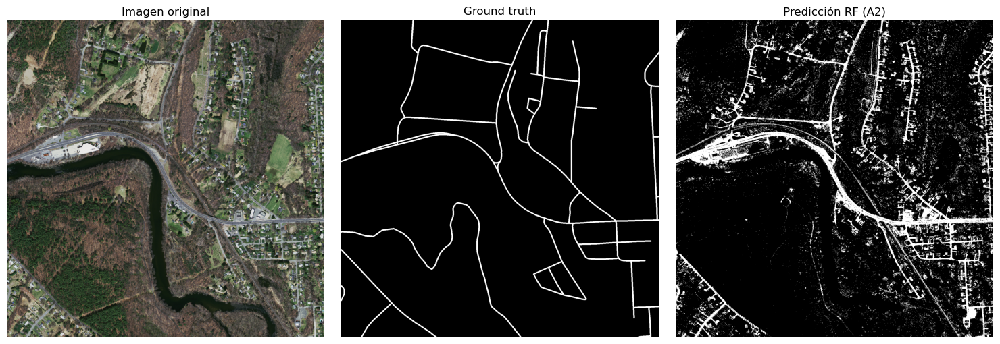

In [15]:
# RANDOM FOREST
# Definimos el modelo.
rf_A2 = RandomForestClassifier(n_estimators= 80,max_depth= 18, min_samples_leaf=8, max_features= "sqrt", random_state=seed, n_jobs=-1, verbose=0)
    
# Lo entrenamos
rf_A2, y_val_pred_rf_A2, metrics_val_rf_A2 = train_and_evaluate_model(rf_A2, X_train_A2_bal, y_train_A2_bal, X_val_A2, y_val_A2,model_name="RandomForest (A2)")

# Guardamos los resultados y visualizamos 
guardar_resultado(resultadosA2, "Random Forest (A2)", rf_A2, y_val_pred_rf_A2, None, metrics_val_rf_A2, None)
show_example_prediction(X_val, y_val, y_val_pred_rf_A2, title="Predicción RF (A2)")


=== LogisticRegression (A2): ENTRENAMIENTO ===
Entrenando con 100000 píxeles...
Modelo entrenado

=== VALIDACIÓN ===

Validación:
Accuracy:0.8259
Precision:0.2273
Recall:0.7441
Jaccard:0.2108
Dice:0.3482


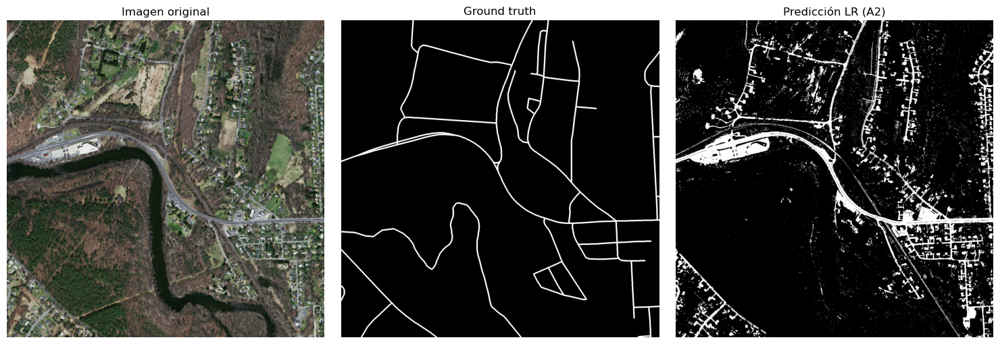

In [16]:
# LOGISTIC REGRESSION
lr_A2 = LogisticRegression(penalty="l2", C=1.0, solver="lbfgs", max_iter=200, n_jobs=-1)

lr_A2, y_val_pred_lr_A2, metrics_val_lr_A2 = train_and_evaluate_model(lr_A2, X_train_A2_bal, y_train_A2_bal, X_val_A2, y_val_A2,model_name="LogisticRegression (A2)")

guardar_resultado(resultadosA2, "Logistic Regression (A2)", lr_A2, y_val_pred_lr_A2, None, metrics_val_lr_A2, None)
show_example_prediction(X_val, y_val, y_val_pred_lr_A2, title="Predicción LR (A2)")


=== KNN (A2): ENTRENAMIENTO ===
Entrenando con 100000 píxeles...
Modelo entrenado

=== VALIDACIÓN ===

Validación:
Accuracy:0.8051
Precision:0.2072
Recall:0.7500
Jaccard:0.1938
Dice:0.3247


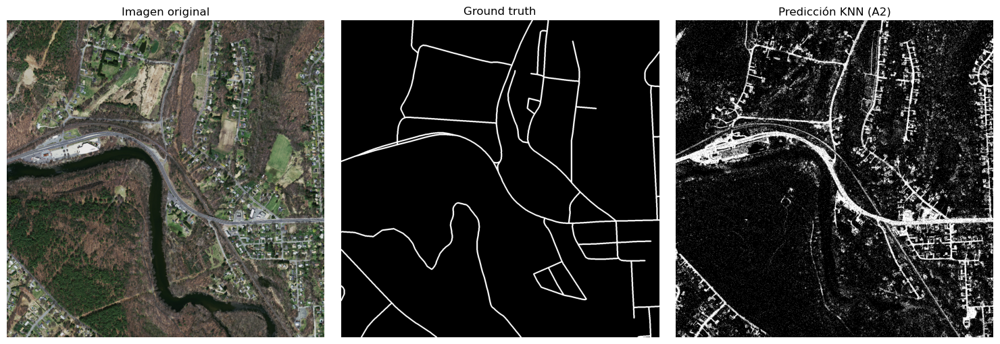

In [17]:
# K NEAREST NEIGHBOURS
knn_A2 = KNeighborsClassifier(n_neighbors= 10, weights="distance",n_jobs=-1)

knn_A2, y_val_pred_knn_A2, metrics_val_knn_A2 = train_and_evaluate_model(knn_A2, X_train_A2_bal, y_train_A2_bal, X_val_A2, y_val_A2, model_name="KNN (A2)")

guardar_resultado(resultadosA2, "KNN (A2)", knn_A2, y_val_pred_knn_A2, None, metrics_val_knn_A2, None)
show_example_prediction(X_val, y_val, y_val_pred_knn_A2, title="Predicción KNN (A2)")


===  Decision Tree (A2): ENTRENAMIENTO ===
Entrenando con 100000 píxeles...
Modelo entrenado

=== VALIDACIÓN ===

Validación:
Accuracy:0.8188
Precision:0.2231
Recall:0.7651
Jaccard:0.2088
Dice:0.3455


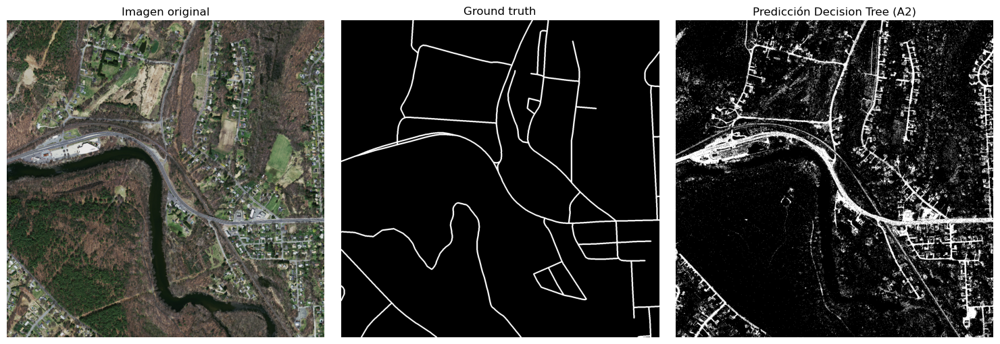

In [18]:
# DECISION TREE 
dt_A2 = DecisionTreeClassifier(max_depth=20, min_samples_leaf=10,  random_state=seed)

# Lo entrenamos 
dt_A2 , y_val_pred_dt_A2, metrics_val_dt_A2   = train_and_evaluate_model(dt_A2, X_train_A2_bal, y_train_A2_bal, X_val_A2, y_val_A2,model_name=" Decision Tree (A2)")
# Guardamos los resultados y visualizamos 
guardar_resultado(resultadosA2, "Decision Tree (A2)", dt_A2 , y_val_pred_dt_A2 , None , metrics_val_dt_A2 , None)
show_example_prediction(X_val, y_val, y_val_pred_dt_A2, title="Predicción Decision Tree (A2)")


=== SVM lineal (A2): ENTRENAMIENTO ===
Entrenando con 100000 píxeles...
Modelo entrenado

=== VALIDACIÓN ===

Validación:
Accuracy:0.8289
Precision:0.2294
Recall:0.7367
Jaccard:0.2120
Dice:0.3499


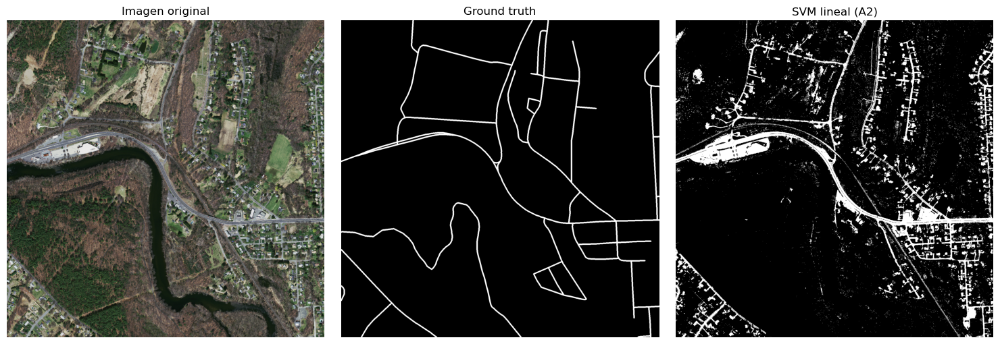

In [19]:
# SVM
svm_A2 = LinearSVC(C=1, max_iter=2000, random_state=seed)

# Lo entrenamos 
svm_A2, y_val_pred_svm_A2, metrics_val_svm_A2 = train_and_evaluate_model(svm_A2, X_train_A2_bal, y_train_A2_bal, X_val_A2, y_val_A2, model_name="SVM lineal (A2)")

# Guardamos los resultados y visualizamos 
guardar_resultado(resultadosA2, "SVM lineal (A2)", svm_A2, y_val_pred_svm_A2, None, metrics_val_svm_A2, None)
show_example_prediction(X_val, y_val, y_val_pred_svm_A2, title="SVM lineal (A2)")

In [20]:
df_A2 = tabla_comparativa(resultadosA2, "Escenario A2: Imágenes balanceadas")

Escenario A2: Imágenes balanceadas


,Modelo,Val_Acc,Val_Prec,Val_Rec,Val_Jaccard,Val_Dice
0,Random Forest (A2),0.824425,0.232210,0.784518,0.218287,0.358351
4,SVM lineal (A2),0.828892,0.229401,0.736681,0.212016,0.349857
1,Logistic Regression (A2),0.825895,0.227270,0.744119,0.210796,0.348194
3,Decision Tree (A2),0.818813,0.223099,0.765110,0.208798,0.345464
2,KNN (A2),0.805061,0.207216,0.749958,0.193825,0.324712


Observando la tabla de resultados, vemos que Random Forest y SVM tienen los valores de Dice más altos. Vamos a ver ahora cómo funcionan estos dos clasificadores sobre el conjunto de test.


=== TEST ===

Test:
Accuracy:0.8304
Precision:0.1196
Recall:0.8419
Jaccard:0.1170
Dice:0.2095


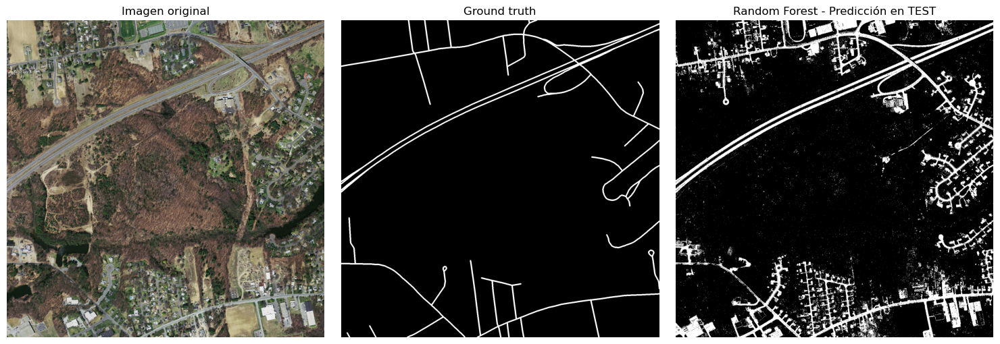

In [21]:
y_test_pred_rf_A2, metrics_test_rf_A2 = evaluate_test(rf_A2,X_test_A2, y_test_A2,model_name= rf_A2)
show_example_prediction(X_test, y_test, y_test_pred_rf_A2, title="Random Forest - Predicción en TEST") 


=== TEST ===

Test:
Accuracy:0.8308
Precision:0.1149
Recall:0.7956
Jaccard:0.1116
Dice:0.2008


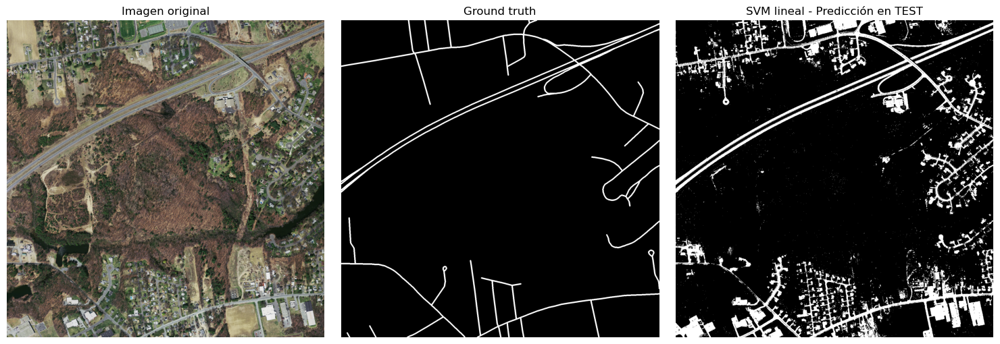

In [22]:
y_test_pred_svm_A2, metrics_test_svm_A2 = evaluate_test(svm_A2, X_test_A2, y_test_A2, model_name= svm_A2)
show_example_prediction(X_test, y_test, y_test_pred_svm_A2, title="SVM lineal - Predicción en TEST")

Con las predicciones de Random Forest y SVM sobre el conjunto de test, observamos que ambos modelos alcanzan una buena capacidad para identificar píxeles positivos (recall alto), pero muestran dificultades para evitar falsas detecciones, lo que se refleja en una precisión baja y en máscaras con ruido disperso. 

Visualmente, los dos clasificadores son capaces de recuperar la estructura general de las carreteras principales, aunque también detectan algunas casas y zonas con texturra similar. 

Para poder acercarnos un poco más al Ground Truth, vamos a aplicar la extracción de características en la siguiente aproximación.

### Aproximación 3: Balanceado + Extracción de Características 

En la **Aproximación 3**, combinamos el undersampling óptimo con la extracción de características definida en la función `extract_all_featrures`, entrenando de nuevo los dos modelos seleccionados en la etapa anterior.

In [23]:
X_train_A3, y_train_A3 = prepare_pixel_dataset(X_train, y_train, feature_type="feat")
print_dataset_info(X_train, y_train, X_train_A3, y_train_A3, "Train orininal")
X_train_A3_bal, y_train_A3_bal = undersample(X_train_A3, y_train_A3, n_per_class= 50000, random_state=seed)
print("Train original:", X_train_A3.shape, " | Train balanceado:", X_train_A3_bal.shape)

X_val_A3, y_val_A3 = prepare_pixel_dataset(X_val, y_val, feature_type="feat")
print_dataset_info(X_val, y_val, X_val_A3, y_val_A3, "Val")

X_test_A3, y_test_A3 = prepare_pixel_dataset(X_test, y_test, feature_type="feat")
print_dataset_info(X_test, y_test, X_test_A3, y_test_A3, "Test")

resultadosA3 = [] 


=== Train orininal ===
Rango sin normalizar:0.00-255.00
Rango normalizado: 0.00-1.00
Tamaño aplanado: (36000000, 20) ; (36000000,)
Train original: (36000000, 20)  | Train balanceado: (100000, 20)

=== Val ===
Rango sin normalizar:0.00-255.00
Rango normalizado: 0.00-1.00
Tamaño aplanado: (4500000, 20) ; (4500000,)

=== Test ===
Rango sin normalizar:0.00-255.00
Rango normalizado: 0.00-1.00
Tamaño aplanado: (4500000, 20) ; (4500000,)



=== RandomForest (A3): ENTRENAMIENTO ===
Entrenando con 100000 píxeles...


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    5.3s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.


Modelo entrenado

=== VALIDACIÓN ===


[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    1.3s
[Parallel(n_jobs=16)]: Done 100 out of 100 | elapsed:    5.4s finished



Validación:
Accuracy:0.8458
Precision:0.2621
Recall:0.8079
Jaccard:0.2467
Dice:0.3958


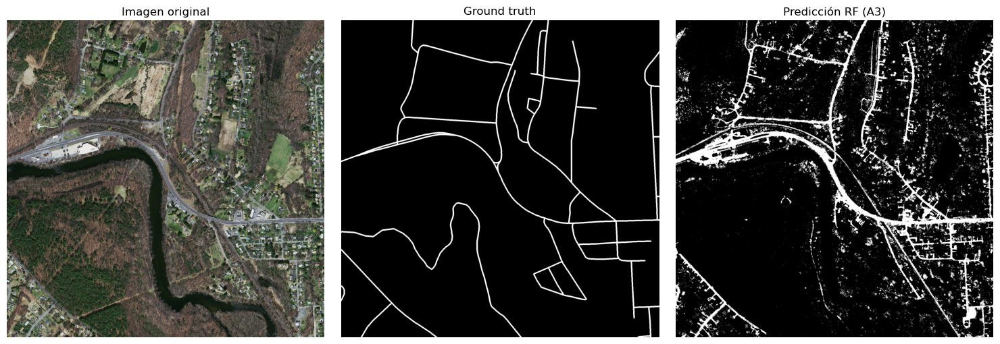

In [24]:
# RANDOM FOREST
# Definimos el modelo.
rf_A3 =  RandomForestClassifier(n_estimators=100, max_depth=20,min_samples_leaf=5,n_jobs=-1, random_state=seed,verbose=1)

# Lo entrenamos 
rf_A3, y_val_pred_rf_A3, metrics_val_rf_A3 = train_and_evaluate_model(rf_A3, X_train_A3_bal, y_train_A3_bal, X_val_A3, y_val_A3, model_name="RandomForest (A3)")

# Guardamos los resultados y visualizamos 
guardar_resultado(resultadosA3, "Random Forest (A3)", rf_A3, y_val_pred_rf_A3, None, metrics_val_rf_A3, None)
show_example_prediction(X_val, y_val, y_val_pred_rf_A3, title="Predicción RF (A3)")


=== SVM lineal(A3): ENTRENAMIENTO ===
Entrenando con 100000 píxeles...
Modelo entrenado

=== VALIDACIÓN ===

Validación:
Accuracy:0.8055
Precision:0.2136
Recall:0.7875
Jaccard:0.2019
Dice:0.3360


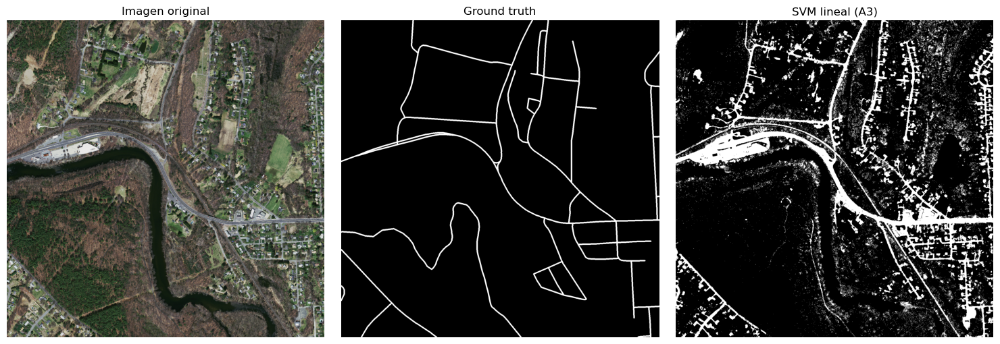

In [25]:
svm_A3 = LinearSVC(C=1, max_iter=2000, random_state=seed)

# Lo entrenamos 
svm_A3, y_val_pred_svm_A3, metrics_val_svm_A3 = train_and_evaluate_model(svm_A3, X_train_A3_bal, y_train_A3_bal, X_val_A3, y_val_A3, model_name="SVM lineal(A3)")

# Guardamos los resultados y visualizamos 
guardar_resultado(resultadosA3, "SVM lineal (A3)", svm_A3, y_val_pred_svm_A3, None, metrics_val_svm_A3, None)
show_example_prediction(X_val, y_val, y_val_pred_svm_A3, title="SVM lineal (A3)")

In [26]:
df_A3 = tabla_comparativa(resultadosA3, "Escenario A3: Imágenes balanceadas + extracción de características")

Escenario A3: Imágenes balanceadas + extracción de características


,Modelo,Val_Acc,Val_Prec,Val_Rec,Val_Jaccard,Val_Dice
0,Random Forest (A3),0.845845,0.262089,0.807880,0.246712,0.395780
1,SVM lineal (A3),0.805496,0.213569,0.787498,0.201931,0.336011


Observando la tabla y, basándonos en el índice de Dice, vemos que la extracción de características mejora los resultados en el caso de Random FOrest, que pasa de un Dice de 0.358 en A2 a 0.396 en la A3. Sin embargo, el comportamiento del SVM es distinto ya que su Dice disminuye un poco de 0.349 a 0.336. 

Creemos que este resultado tiene sentido por la forma en la que funcionan los modelos. El SVM lineal suele rendir mejor cuando trabaja con pocas características y cuando la separación entre clases es relativamente simple. Al aumentar el número de canales con la extracción de características, el espacio se vuelve más complejo y una frontera lineal puede no ser suficiente, lo que explica la caída en su rendimiento. En cambio, Random Forest sí aprovecha esta información adicional, porque sus árboles pueden capturar relaciones no lineales entre las nuevas características. Esto confirma que la ingeniería de características no beneficia por igual a todos los modelos y que aquellos con mayor flexibilidad suelen sacar más partido de ella.

Dado que el SVM no muestra una mejora en esta aproximación, emplearemos ahora nuetro mejor modelo hasta el momento: Random Forest. Ahora vamos a ver su comportamiento sobre el conjunto de test.


=== TEST ===


[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    1.6s
[Parallel(n_jobs=16)]: Done 100 out of 100 | elapsed:    6.2s finished



Test:
Accuracy:0.8466
Precision:0.1328
Recall:0.8583
Jaccard:0.1300
Dice:0.2300


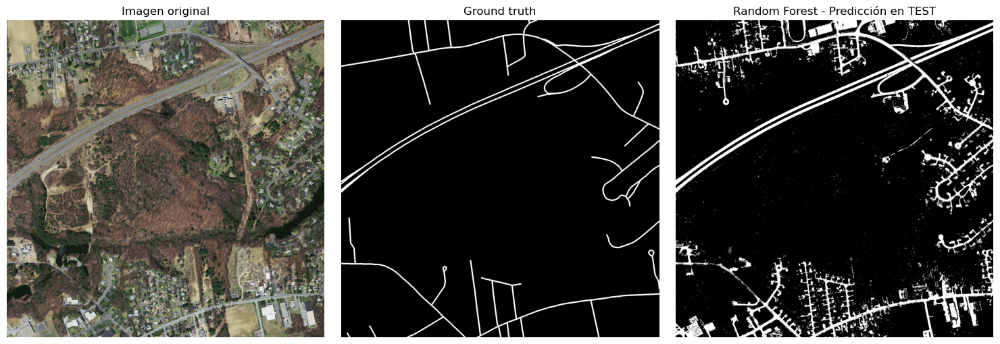

In [27]:
y_test_pred_rf_A3, metrics_test_rf_A3 = evaluate_test(rf_A3, X_test_A3, y_test_A3, model_name= rf_A3)
show_example_prediction(X_test, y_test, y_test_pred_rf_A3, title="Random Forest - Predicción en TEST") 

El Random Forest en esta aproximación muestra una mejora respecto a las versiones anteriores, sobre todo en métricas como el recall y el índice de Dice. El modelo es capaz de identificar una gran parte de píxeles correspondientes a carretera, lo que indica que las características extraídas le permiten reconocer con mayor facilidad. Sin embargo, la precisión sigue siendo baja y la máscara resultante contiene bastante ruido, especialmente en las zonas donde hay casas o mucha textura. Aun así, las carreteras principales aparecen mejor definidas y más continuas, reflejando que la extracción de características mejora la capacidad del modelo para capturar las calles. 

Ahora, sobre estos resultados tenemos que aplicar postprocesado para eliminar falsas detecciones y obtener una máscara más limpia.

Ahora, aplicaremos postprocesado al mejor modelo obtenido hasta ahora. 

### Aproximación 4: Postprocesado

En esta **Aproximación 4** no entrenamos un modelo nuevo, sino que partimos del mejor modelo obtenido en la Aproximación 3 (el Random Forest entrenado con características) y aplicamos un **postprocesado morfológico** sobre las máscaras binarias predichas. El objetivo es eliminar ruído y ellenar huecos y pequeñas discontinuidades en las carreteras.

Para ello:

1. Reconstruimos las máscaras 2D a partir de las predicciones aplanadas del modelo.
2. Aplicamos sobre cada máscara operaciones morfológicas sencillas (eliminación de objetos pequeños, eliminación de pequeños agujeros, opening y closing).
- **Opening (apertura)**: erosión seguida de dilatación. Tiende a eliminar regiones pequeñas y delgadas, por lo que nos ayuda a limpiar puntos sueltos o manchas muy pequeñas de carretera que en realidad son ruido.
- **Closing (clausura)**: dilatación seguida de erosión. Tiende a rellenar pequeños huecos dentro de las regiones positivas y a cerrar cortes finos, lo que resulta útil para hacer que las carreteras sean más continuas.
3. Volvemos a aplanar las máscaras postprocesadas para poder calcular las métricas con el mismo formato que en las aproximaciones anteriores.

De esta forma podremos comparar en la tabla global cómo mejora el rendimiento al añadir este postprocesado sobre el mejor modelo anterior.


In [ ]:
def postprocesar_mascara(mascara_pred):
    mascara = mascara_pred.astype(bool)
    mascara = binary_opening(mascara, disk(3)) # Opening moderado para eliminar ruido disperso
    mascara = binary_closing(mascara, disk(5)) # Closing moderado para conectar carreteras cercanas
    mascara = remove_small_objects(mascara, min_size=400) # Eliminar objetos pequeños (valor intermedio)
    mascara = binary_opening(mascara, disk(1))  #Suavizado final ligero
    return mascara.astype(np.uint8)

def postprocesar_predicciones_aplanadas(y_pred_flat, y_imgs):
    n, h, w = y_imgs.shape
    y_pred_img = y_pred_flat.reshape(n, h, w)

    y_pred_pp_img = np.zeros_like(y_pred_img, dtype=np.uint8)
    for i in range(n):
        y_pred_pp_img[i] = postprocesar_mascara(y_pred_img[i])

    return y_pred_pp_img.reshape(-1)



[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    1.6s
[Parallel(n_jobs=16)]: Done 100 out of 100 | elapsed:    6.8s finished
[Parallel(n_jobs=16)]: Using backend ThreadingBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  18 tasks      | elapsed:    1.4s
[Parallel(n_jobs=16)]: Done 100 out of 100 | elapsed:    6.8s finished


=== VALIDACIÓN (antes del postprocesado) ===

RF (A3) sin postprocesado:
Accuracy:0.8458
Precision:0.2621
Recall:0.8079
Jaccard:0.2467
Dice:0.3958

=== TEST (antes del postprocesado) ===

RF (A3) sin postprocesado:
Accuracy:0.8466
Precision:0.1328
Recall:0.8583
Jaccard:0.1300
Dice:0.2300

=== VALIDACIÓN (después del postprocesado) ===

RF (A3) + postprocesado:
Accuracy:0.9143
Precision:0.3963
Recall:0.7096
Jaccard:0.3410
Dice:0.5086

=== TEST (después del postprocesado) ===

RF (A3) + postprocesado:
Accuracy:0.8747
Precision:0.1504
Recall:0.7941
Jaccard:0.1447
Dice:0.2528


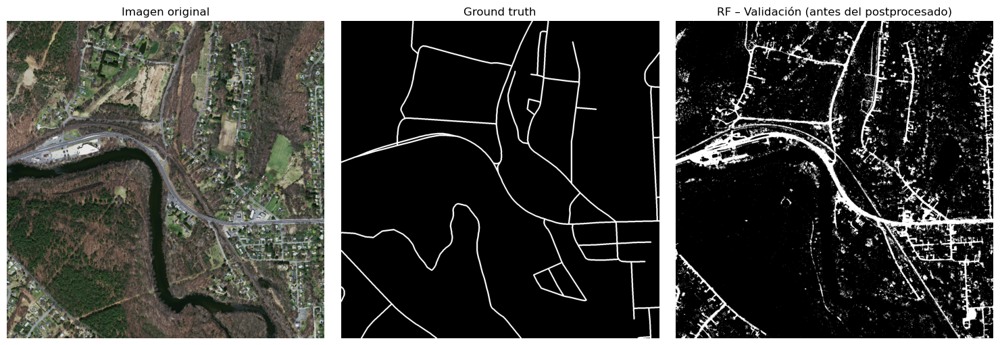

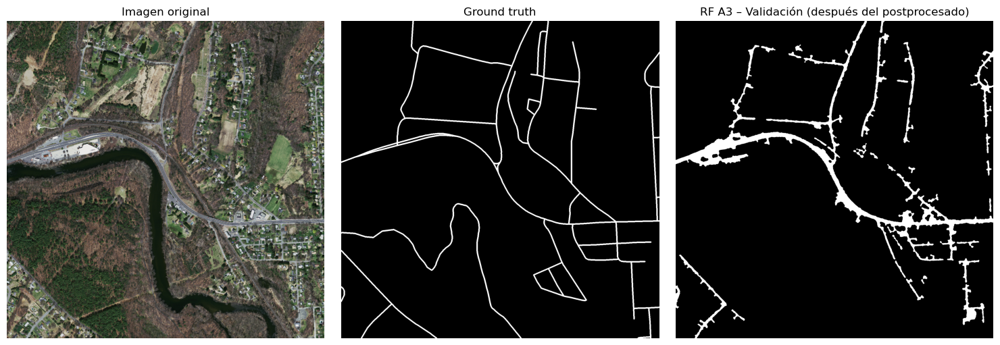

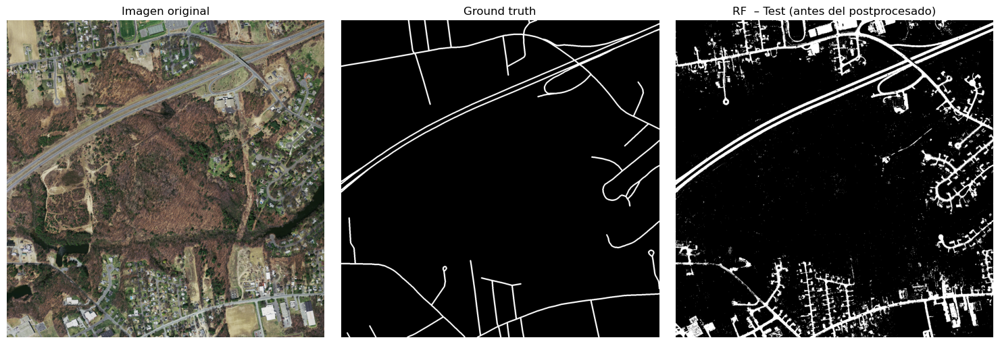

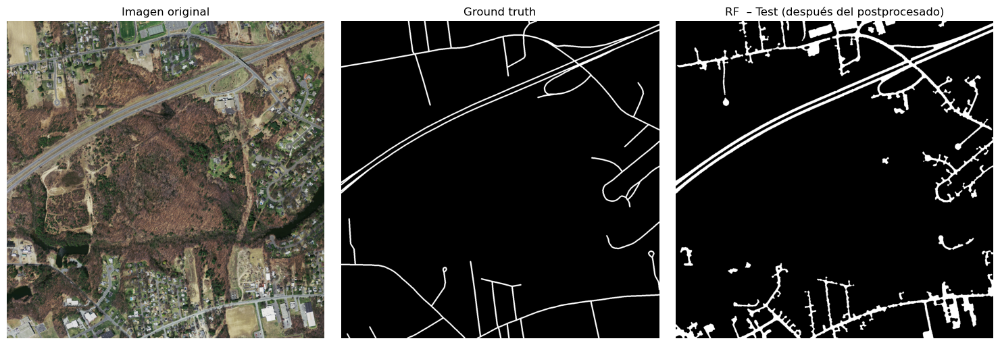

In [33]:
# Partimos del mejor modelo de la Aproximación 3: rf_A3 entrenado sobre X_train_A3_bal

# 1) Predicciones originales (sin postprocesado)
y_val_pred_rf_A3  = rf_A3.predict(X_val_A3)
y_test_pred_rf_A3 = rf_A3.predict(X_test_A3)

print("=== VALIDACIÓN (antes del postprocesado) ===")
metrics_val_rf_A3 = metrics(y_val_A3, y_val_pred_rf_A3, name="RF (A3) sin postprocesado")

print("\n=== TEST (antes del postprocesado) ===")
metrics_test_rf_A3 = metrics(y_test_A3, y_test_pred_rf_A3, name="RF (A3) sin postprocesado")

# 2) Aplicamos el postprocesado morfológico sobre las máscaras predichas
y_val_pred_rf_A3_pp = postprocesar_predicciones_aplanadas(y_val_pred_rf_A3, y_val)
y_test_pred_rf_A3_pp = postprocesar_predicciones_aplanadas(y_test_pred_rf_A3, y_test)

print("\n=== VALIDACIÓN (después del postprocesado) ===")
metrics_val_rf_A4 = metrics(y_val_A3, y_val_pred_rf_A3_pp, name="RF (A3) + postprocesado")

print("\n=== TEST (después del postprocesado) ===")
metrics_test_rf_A4 = metrics(y_test_A3, y_test_pred_rf_A3_pp, name="RF (A3) + postprocesado")

# 3) Visualizamos un ejemplo antes / después en validación y en test 
show_example_prediction(X_val, y_val, y_val_pred_rf_A3, title="RF – Validación (antes del postprocesado)")
show_example_prediction(X_val, y_val, y_val_pred_rf_A3_pp,title="RF A3 – Validación (después del postprocesado)")
show_example_prediction(X_test,y_test,y_test_pred_rf_A3,title="RF  – Test (antes del postprocesado)")
show_example_prediction(X_test,y_test,y_test_pred_rf_A3_pp,title="RF  – Test (después del postprocesado)")

# Guardamos los resultados de esta aproximación 4
# Esto lo usamos solo para la comparación global
resultadosA4 = []
guardar_resultado(resultadosA4, "Random Forest (A4)", rf_A3,y_val_pred_rf_A3_pp, y_test_pred_rf_A3_pp, metrics_val_rf_A4, metrics_test_rf_A4,)

### Tabla comparativa global

In [ ]:
best_A1 = mejor_modelo(resultadosA1)
best_A2 = mejor_modelo(resultadosA2)
best_A3 = mejor_modelo(resultadosA3)
best_A4 = mejor_modelo(resultadosA4)

resultados_global = [best_A1, best_A2, best_A3, best_A4]

df_global = tabla_comparativa(
    resultados_global,
    "Comparación de escenarios (mejor modelo de cada aproximación)",
)


Comparación de escenarios (mejor modelo de cada aproximación)


,Modelo,Val_Acc,Val_Prec,Val_Rec,Val_Jaccard,Val_Dice
3,Random Forest (A4),0.914289,0.396272,0.709631,0.340983,0.508557
2,Random Forest (A3),0.845845,0.262089,0.807880,0.246712,0.395780
0,"Random Forest (A1, n=200000)",0.825064,0.232724,0.783316,0.218648,0.358837
1,Random Forest (A2),0.824425,0.232210,0.784518,0.218287,0.358351
